# 1)    Introduction


## 1.1) Motivation
One of the biggest and most complicated marketplaces in the world is real estate, which is affected by a variety of external variables, fluctuating prices, supply and demand dynamics, and other factors. Homeowners, prospective buyers, sellers, and investors may find accurate real estate price forecasting to be an extremely useful instrument. Real estate price forecasting can help with risk management strategies, investment choices, and useful market insights.

To help with investment decisions, real estate price forecasting is one of the primary goals. Price prediction models can help investors and financial institutions assess the potential returns of real estate investments, assess the risk involved with investments, and make well-informed choices. Real estate price forecasting can be used to find profitable investment possibilities, boost returns, and reduce risks.

To ease economic analysis, real estate price forecasting is also important. Real estate is a crucial aspect of the economy, and changes in the real estate market can reveal how well-off a nation or region's economy is overall. Policymakers can spot trends, decide on interest rates intelligently, and control economic development by looking at real estate prices. Accurate real estate price forecasts can also help banks and other financial organizations assess the strength of their loan portfolios and modify their lending policies as necessary.

The control of risks can also benefit from real estate price forecasting. Real estate price prediction models are used by banks and other financial organizations to evaluate the risk of mortgage loans. Lenders can determine the probability of default, modify their lending practices appropriately, and make wise choices regarding risk management by analyzing historical data.

The ability to forecast real estate values can also be useful for marketing initiatives. Price prediction models can be used by real estate brokers to find prospective buyers and sellers as well as to decide on the best pricing strategy for a given property. Agents can improve their recommendations to clients and improve their odds of closing deals by having a better understanding of the variables that influence real estate prices.

In conclusion, predicting real estate prices can be a powerful tool for homeowners, buyers, sellers, investors, policymakers, and real estate agents. By providing valuable insights into market trends, informing investment decisions, and facilitating risk management strategies, accurate price predictions can help maximize returns, minimize risks, and foster economic growth.

## 1.2) Problem Definition
House price fluctuations can have significant impacts on the economy and society. Over the past few decades, there have been major fluctuations in housing prices in the US. A housing bubble developed in the middle of the 2000s, fueled by speculative activity, loose lending standards, and cheap interest rates. The housing market crashed after the bubble burst, which added to the 2008 financial crisis. Since then, home prices have increased, but they are still prone to changes due to local economic circumstances and supply and demand dynamics. House prices have steadily increased in the UK for decadeds, propelled by factors like population development, low interest rates, and government initiatives that encourage home ownership. The COVID-19 pandemic and the uncertainty surrounding Brexit, however, have raised market volatility recently, causing some areas to see price drops and others to see substantial price increases. In Vietnam real estate bubble from 2007 to 2009 resulted in macroeconomic instability like high inflation, trade deficiency, and slowed economic development.

Given that investing in the real estate sector is a long-term type of investment, the price of real estate becomes an essential asset in the measurement of inflation. Statistics on real estate may offer an early indicator of changes in the economic cycle. Rising of property prices 
often leads to an expansionary phase period (boom) whereas falling of property 
prices indicate a contractionary phase (bust) (Eurostat, 2013).

In such favorable circumstances, the need for appropriate indexes that allow for precise recording of changes in real estate prices was critical. This not only helps policymakers but also market participants looking for the bottom or peak of housing prices. As a result, housing price indexes that properly capture housing market trends are required.

The establishment of such indexes, however, is a challenging task due to the heterogeneity of residential properties in terms of structural characteristics such as location, size, and amenities. Each house, including the location, upkeep, and appliances, has unique and distinguishing characteristics to varying degrees, so no two houses are similar in terms of quality. Even if the location and fundamental structure remain the same over time, the ages and quality of the structures and houses do not remain constant due to renovations and structural depreciation. Furthermore, considering houses are sold infrequently, the limited frequency of transaction data accessible makes it difficult to apply the "like with like" method to house pricing as the method of other price indexes such as the consumer price index or the producer price index.

As a consequence, developing housing price indexes was one of the most challenging jobs for national statistical agencies in terms of methodology.

## 1.3) Main contributions

Australia has the world's sixth-largest land area, with a varied variety of landscapes and scenery ranging from tropical rainforests to vast deserts. Australia's distinct geography and natural beauty have a significant impact on its real estate market, with properties providing a diverse range of lifestyle and investment options. Due to the stunning views and proximity to outdoor activities such as hiking, fishing, and surfing, properties near the shore or in the countryside are in high demand. The growing population and urbanization trends in Australia also have an impact on the real estate market, with more people moving to big cities for work and lifestyle possibilities.

The real estate market in Australia has seen fluctuations in recent years, with rising property prices and concerns over housing affordability. However, despite these issues, the market remains robust with a growing population and stable economy driving demand for properties. Due to the COVID-19 pandemic, there was a slight downturn in the market, but it has since rebounded.

Perth, the capital city of Western Australia, has had its own ups and downs in the real estate market, but it is now showing signs of recovery. Low-interest rates, government incentives, and population growth have led to an increase in demand for properties. Perth's stable economy, with a focus on mining, agriculture, and tourism, and its location make it an attractive destination for international investors. With its abundantly records of estate sold including dependable and comprehensive data, such as pertinent information like property prices, types, and location, we have decided to use Perth's estate sale data to construct predictive models that correctly forecast future property prices.  

The dataset is retrieved from a project in Kaggle. This data was scraped from http://house.speakingsame.com/ and includes data from 322 Perth suburbs, resulting in an average of about 100 rows per suburb. Other than scrapping from this source, longitude and latitude data was obtained from data.gov.au. School ranking data was obtained from bettereducation. The closest schools to each address in this dataset are those that are designated as 'ATAR-applicable'. ATAR is a scoring system used in the Australian secondary school education system to evaluate a student's culminative academic results and is used for entry into Australian universities. As a result, schools that do not have an ATAR program, such as primary schools, vocational schools, special needs schools, and so on, are not taken into account when determining the closest school. Please keep in mind that there are some missing rows in the "NEAREST_SCH_RANK" column because some institutions are not ranked according to this criteria by bettereducation.


# 2.) Data preprocessing

Import all libraries

In [102]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
import tensorflow as tf
import folium
import plotly.express as px
import plotly.graph_objects as go
import plotly.graph_objs as go
from plotly.subplots import make_subplots

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,mean_absolute_error,explained_variance_score, r2_score

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LeakyReLU
from tensorflow.keras.activations import linear, relu, sigmoid

## 2.1) Perth house pricing dataframe

Import dataset

In [103]:
df = pd.read_csv("https://raw.githubusercontent.com/HuyQuangCSE/dataset/main/all_perth_310121.csv")
df

,ADDRESS,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,NEAREST_STN_DIST,DATE_SOLD,POSTCODE,LATITUDE,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,NEAREST_SCH_RANK
0,1 Acorn Place,South Lake,565000,4,2,2.0,600,160,2003.0,18300,Cockburn Central Station,1800,09-2018\r,6164,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,NaN
1,1 Addis Way,Wandi,365000,3,2,2.0,351,139,2013.0,26900,Kwinana Station,4900,02-2019\r,6167,-32.193470,115.859554,ATWELL COLLEGE,5.524324,129.0
2,1 Ainsley Court,Camillo,287000,3,1,1.0,719,86,1979.0,22600,Challis Station,1900,06-2015\r,6111,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,113.0
3,1 Albert Street,Bellevue,255000,2,1,2.0,651,59,1953.0,17900,Midland Station,3600,07-2018\r,6056,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,NaN
4,1 Aman Place,Lockridge,325000,4,1,2.0,466,131,1998.0,11200,Bassendean Station,2000,11-2016\r,6054,-31.885790,115.947780,KIARA COLLEGE,1.514922,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33651,9C Gold Street,South Fremantle,1040000,4,3,2.0,292,245,2013.0,16100,Fremantle Station,1500,03-2016\r,6162,-32.064580,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350,49.0
33652,9C Pycombe Way,Westminster,410000,3,2,2.0,228,114,NaN,9600,Stirling Station,4600,02-2017\r,6061,-31.867055,115.841403,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.679644,35.0
33653,9D Pycombe Way,Westminster,427000,3,2,2.0,261,112,NaN,9600,Stirling Station,4600,02-2017\r,6061,-31.866890,115.841418,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.669159,35.0
33654,9D Shalford Way,Girrawheen,295000,3,1,2.0,457,85,1974.0,12600,Warwick Station,4400,10-2016\r,6064,-31.839680,115.842410,GIRRAWHEEN SENIOR HIGH SCHOOL,0.358494,NaN


### 2.1.1) Keep neccessary attributes

In [104]:
features = ['BEDROOMS', 'BATHROOMS', 'GARAGE',
       'LAND_AREA', 'FLOOR_AREA', 
       'BUILD_YEAR',  'DATE_SOLD',
       'CBD_DIST','NEAREST_STN_DIST',
       'SUBURB', 'PRICE']
df = df.filter(features)

### 2.1.2) Deal with missing data

Count *missing value* in ```df```

In [105]:
df.isna().sum()

BEDROOMS               0
BATHROOMS              0
GARAGE              2478
LAND_AREA              0
FLOOR_AREA             0
BUILD_YEAR          3155
DATE_SOLD              0
CBD_DIST               0
NEAREST_STN_DIST       0
SUBURB                 0
PRICE                  0
dtype: int64

There are two columns that have *missing values*, which are ```GARAGE```, ```BUILD_YEAR```.

For ```BUILD_YEAR``` column, we will remove rows that have *missing values* on this attribute

In [106]:
df.dropna(subset=["BUILD_YEAR"], axis=0, inplace=True)

In [107]:
df['GARAGE'].value_counts()

2.0     18747
1.0      4834
3.0      1858
4.0      1767
6.0       418
5.0       327
8.0       115
7.0        86
10.0       24
12.0       24
9.0        16
14.0       11
13.0        7
11.0        5
16.0        4
18.0        3
20.0        2
32.0        1
17.0        1
21.0        1
99.0        1
26.0        1
22.0        1
50.0        1
31.0        1
Name: GARAGE, dtype: int64

As my suspected, there is no value **0** which means the NaN value is for 0 garage

For ```GARAGE``` column, we will replace *missing values* with ```0```

In [108]:
df['GARAGE'].replace(np.nan, 0, inplace=True)
df['GARAGE'] = df['GARAGE'].astype('int')

Recheck the number of ```NA``` in the dataset

In [109]:
df.isna().sum()

BEDROOMS            0
BATHROOMS           0
GARAGE              0
LAND_AREA           0
FLOOR_AREA          0
BUILD_YEAR          0
DATE_SOLD           0
CBD_DIST            0
NEAREST_STN_DIST    0
SUBURB              0
PRICE               0
dtype: int64

### 2.1.3) Calculate house age

First we add a column called ```SOLD_YEAR```, which is the **year of purchased** from column ```DATE_SOLD```

In [110]:
#create SOLD_YEAR FROM DATE_SOLD
df['SOLD_YEAR'] = df['DATE_SOLD'].str.extract('(\d{4})')
df['SOLD_YEAR'] = df['SOLD_YEAR'].astype('int64')
#drop DATE_SOLD
df = df.drop('DATE_SOLD', axis=1)
df

,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN_DIST,SUBURB,PRICE,SOLD_YEAR
0,4,2,2,600,160,2003.0,18300,1800,South Lake,565000,2018
1,3,2,2,351,139,2013.0,26900,4900,Wandi,365000,2019
2,3,1,1,719,86,1979.0,22600,1900,Camillo,287000,2015
3,2,1,2,651,59,1953.0,17900,3600,Bellevue,255000,2018
4,4,1,2,466,131,1998.0,11200,2000,Lockridge,325000,2016
...,...,...,...,...,...,...,...,...,...,...,...
33648,3,2,2,248,108,2011.0,24900,5700,Aubin Grove,423000,2016
33649,4,2,2,400,132,2014.0,17100,2500,Middle Swan,467000,2015
33650,3,2,1,200,127,1997.0,16000,1900,South Fremantle,955000,2019
33651,4,3,2,292,245,2013.0,16100,1500,South Fremantle,1040000,2016


Calculate ```AGE``` of the house at the time of purchased by subtracting the ```BUILD_YEAR``` from the ```SOLD_YEAR```

In [111]:
df_age = df['SOLD_YEAR'].astype('int') - df['BUILD_YEAR'].astype('int')
df_age =df_age.to_frame()
df_age.columns = ["AGE"]
df = pd.concat([df, df_age], axis = 1)
df

,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN_DIST,SUBURB,PRICE,SOLD_YEAR,AGE
0,4,2,2,600,160,2003.0,18300,1800,South Lake,565000,2018,15
1,3,2,2,351,139,2013.0,26900,4900,Wandi,365000,2019,6
2,3,1,1,719,86,1979.0,22600,1900,Camillo,287000,2015,36
3,2,1,2,651,59,1953.0,17900,3600,Bellevue,255000,2018,65
4,4,1,2,466,131,1998.0,11200,2000,Lockridge,325000,2016,18
...,...,...,...,...,...,...,...,...,...,...,...,...
33648,3,2,2,248,108,2011.0,24900,5700,Aubin Grove,423000,2016,5
33649,4,2,2,400,132,2014.0,17100,2500,Middle Swan,467000,2015,1
33650,3,2,1,200,127,1997.0,16000,1900,South Fremantle,955000,2019,22
33651,4,3,2,292,245,2013.0,16100,1500,South Fremantle,1040000,2016,3


There are houses with negative ```AGE```, these records are considered to be pre-built house sales, which has another way of evaluating the prices and we should remove them

Drop the row with negative ```AGE```

In [112]:
df = df[df['AGE']>=0]
df.dropna(subset=["AGE"], axis=0, inplace=True)
df

C:\Users\Admin\AppData\Local\Temp\ipykernel_480\2537781785.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN_DIST,SUBURB,PRICE,SOLD_YEAR,AGE
0,4,2,2,600,160,2003.0,18300,1800,South Lake,565000,2018,15
1,3,2,2,351,139,2013.0,26900,4900,Wandi,365000,2019,6
2,3,1,1,719,86,1979.0,22600,1900,Camillo,287000,2015,36
3,2,1,2,651,59,1953.0,17900,3600,Bellevue,255000,2018,65
4,4,1,2,466,131,1998.0,11200,2000,Lockridge,325000,2016,18
...,...,...,...,...,...,...,...,...,...,...,...,...
33648,3,2,2,248,108,2011.0,24900,5700,Aubin Grove,423000,2016,5
33649,4,2,2,400,132,2014.0,17100,2500,Middle Swan,467000,2015,1
33650,3,2,1,200,127,1997.0,16000,1900,South Fremantle,955000,2019,22
33651,4,3,2,292,245,2013.0,16100,1500,South Fremantle,1040000,2016,3


## 2.2) Australia economy dataframe

Import dataset

In [113]:
df_eco = pd.read_csv("https://raw.githubusercontent.com/siunhanvjp/economic_index/main/econ.csv")
df_eco.head(5)

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Australia,AUS,"Intentional homicides, female (per 100,000 fem...",VC.IHR.PSRC.FE.P5,NaN,NaN,NaN,NaN,NaN,NaN,...,7.240372e-01,8.068749e-01,7.945190e-01,7.044785e-01,6.569587e-01,5.104944e-01,6.720656e-01,5.374691e-01,5.780683e-01,NaN
1,Australia,AUS,Battle-related deaths (number of people),VC.BTL.DETH,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.000000e+00,NaN,NaN,NaN
2,Australia,AUS,High-technology exports (current US$),TX.VAL.TECH.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,5.466439e+09,5.341236e+09,5.455318e+09,5.089628e+09,5.375125e+09,4.900488e+09,5.231520e+09,6.347420e+09,5.597905e+09,6.309320e+09
3,Australia,AUS,Merchandise exports to low- and middle-income ...,TX.VAL.MRCH.WR.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Australia,AUS,Merchandise exports to low- and middle-income ...,TX.VAL.MRCH.R5.ZS,3.410945,3.057516,3.263162,2.530368,2.300742,2.674637,...,5.508542e+00,4.109189e+00,3.793710e+00,4.908513e+00,4.273753e+00,5.722492e+00,5.101246e+00,3.991841e+00,3.410887e+00,NaN


### 2.2.1) Keep neccessary attributes

Calculate the range of ```SOLD_YEAR```

In [114]:
print(df.SOLD_YEAR.min(), df.SOLD_YEAR.max())

1988 2020


```SOLD_YEAR``` range from 1988 to 2020, so we will take the economic indicators from 1988 to 2020

In [115]:
#Take econ_index from 1988-2020
taken_years = [str(i) for i in range(1988, 2020 + 1)]
df_eco = df_eco.filter( ["Indicator Code", "Indicator Name"] + taken_years)

We will filter out the needed indicators, which are:
* Inflation rate
* Interest rate
* Population growth
* Unemployment



| Attempt | #1    | #2    |
| :---:   | :---: | :---: |
| Seconds | 301   | 283   |

In [116]:
# Filter out the needed econ_index
# FP.CPI.TOTL.ZG - Inflation rate
# FR.INR.LEND _ Interest rate
# SP.POP.GROW _ Population growth
# SL.UEM.TOTL.NE.ZS _ Unemployment
econ_indexes = ['FP.CPI.TOTL.ZG',
                'FR.INR.LEND',
                'SP.POP.GROW',
                'SL.UEM.TOTL.NE.ZS'
                ]
df_eco = df_eco[df_eco['Indicator Code'].isin(econ_indexes)]
df_eco

,Indicator Code,Indicator Name,1988,1989,1990,1991,1992,1993,1994,1995,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
113,FR.INR.LEND,Lending interest rate (%),14.083333,16.458333,16.354167,13.416667,10.583333,9.416667,9.087500,10.500000,...,7.737500,6.97500,6.179167,5.950000,5.575000,5.420833,5.245500,5.260833,5.101000,NaN
205,SP.POP.GROW,Population growth (annual %),1.636149,1.692880,1.480047,1.274622,1.119598,0.889540,0.963092,1.113734,...,1.389527,1.74582,1.721151,1.491566,1.439217,1.561940,1.653391,1.502993,1.485208,1.235701
385,SL.UEM.TOTL.NE.ZS,"Unemployment, total (% of total labor force) (...",7.230000,6.180000,6.930000,9.580000,10.730000,10.870000,9.720000,8.470000,...,5.080000,5.22000,5.660000,6.080000,6.050000,5.710000,5.590000,5.300000,5.160000,6.460000
902,FP.CPI.TOTL.ZG,"Inflation, consumer prices (annual %)",7.215940,7.533903,7.333022,3.176675,1.012231,1.753653,1.969635,4.627767,...,3.303850,1.76278,2.449889,2.487923,1.508367,1.276991,1.948647,1.911401,1.610768,0.846906


### 2.2.2) Reformat the dataframe

Change the name of the **Indicator** attribute and transpose the dataframe for better understanding

In [117]:
#Rename some of the economic indicator
df_eco.loc[df_eco['Indicator Code'] == 'FR.INR.LEND', 'Indicator Name'] = 'Interest_Rate'
df_eco.loc[df_eco['Indicator Code'] == 'SP.POP.GROW', 'Indicator Name'] = 'Pop_Growth'
df_eco.loc[df_eco['Indicator Code'] == 'SL.UEM.TOTL.NE.ZS', 'Indicator Name'] = 'Unemployment'
df_eco.loc[df_eco['Indicator Code'] == 'FP.CPI.TOTL.ZG', 'Indicator Name'] = 'Inflation'
df_eco.drop(columns=["Indicator Code"], inplace = True)

df_eco = df_eco.transpose()
df_eco.columns = ['Interest_Rate', 'Pop_Growth', 'Unemployment', 'Inflation']
df_eco = df_eco.drop(df_eco.index[0])
df_eco[['Interest_Rate','Pop_Growth', 'Unemployment', 'Inflation']] = df_eco[['Interest_Rate','Pop_Growth', 'Unemployment', 'Inflation']].astype('float64')
df_eco.head(5)

,Interest_Rate,Pop_Growth,Unemployment,Inflation
1988,14.083333,1.636149,7.23,7.215940
1989,16.458333,1.692880,6.18,7.533903
1990,16.354167,1.480047,6.93,7.333022
1991,13.416667,1.274622,9.58,3.176675
1992,10.583333,1.119598,10.73,1.012231


Fill *missing value* with previous 5-year mean

In [118]:
#fill missing value with previous 5 years median
df_eco.loc['2020', 'Interest_Rate'] = df_eco.loc['2020', 'Interest_Rate'] if pd.notna(df_eco.loc['2020', 'Interest_Rate']) else df_eco.loc['2015':'2019', 'Interest_Rate'].mean()
df_eco

,Interest_Rate,Pop_Growth,Unemployment,Inflation
1988,14.083333,1.636149,7.23,7.215940
1989,16.458333,1.692880,6.18,7.533903
1990,16.354167,1.480047,6.93,7.333022
1991,13.416667,1.274622,9.58,3.176675
1992,10.583333,1.119598,10.73,1.012231
1993,9.416667,0.889540,10.87,1.753653
1994,9.087500,0.963092,9.72,1.969635
1995,10.500000,1.113734,8.47,4.627767
1996,9.729167,1.213855,8.51,2.615385
1997,7.166667,1.082040,8.36,0.224888


## 2.3) Scale the price

### 2.3.1) Merge dataframe

We will link each row in dataframe ```perth_housing_price``` with the economic indicators of the year it being sold

In [119]:
df['SOLD_YEAR'] = df['SOLD_YEAR'].astype(str)
df = pd.merge(df, df_eco, left_on='SOLD_YEAR', right_index=True, how='left')
df['SOLD_YEAR'] = df['SOLD_YEAR'].astype('int64')
df['PRICE'] = df['PRICE'].astype('float64')
df

C:\Users\Admin\AppData\Local\Temp\ipykernel_480\1172938403.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN_DIST,SUBURB,PRICE,SOLD_YEAR,AGE,Interest_Rate,Pop_Growth,Unemployment,Inflation
0,4,2,2,600,160,2003.0,18300,1800,South Lake,565000.0,2018,15,5.260833,1.502993,5.30,1.911401
1,3,2,2,351,139,2013.0,26900,4900,Wandi,365000.0,2019,6,5.101000,1.485208,5.16,1.610768
2,3,1,1,719,86,1979.0,22600,1900,Camillo,287000.0,2015,36,5.575000,1.439217,6.05,1.508367
3,2,1,2,651,59,1953.0,17900,3600,Bellevue,255000.0,2018,65,5.260833,1.502993,5.30,1.911401
4,4,1,2,466,131,1998.0,11200,2000,Lockridge,325000.0,2016,18,5.420833,1.561940,5.71,1.276991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33648,3,2,2,248,108,2011.0,24900,5700,Aubin Grove,423000.0,2016,5,5.420833,1.561940,5.71,1.276991
33649,4,2,2,400,132,2014.0,17100,2500,Middle Swan,467000.0,2015,1,5.575000,1.439217,6.05,1.508367
33650,3,2,1,200,127,1997.0,16000,1900,South Fremantle,955000.0,2019,22,5.101000,1.485208,5.16,1.610768
33651,4,3,2,292,245,2013.0,16100,1500,South Fremantle,1040000.0,2016,3,5.420833,1.561940,5.71,1.276991


### 2.3.2) Scale the price with respect to inflation

In [120]:
def adjust_price(init_price, sold_year, scale_year = 2020):
    adjusted_price = init_price
    for yr in range(sold_year, scale_year):
        adjusted_price = round(adjusted_price * (100 + df_eco.loc[str(yr), 'Inflation']) / 100, 1)
    return adjusted_price
df['SCALED_PRICE'] = df.apply(lambda row: adjust_price(row['PRICE'], row['SOLD_YEAR']), axis = 1)
df = df.drop(['PRICE'],axis = 1)
df

,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN_DIST,SUBURB,SOLD_YEAR,AGE,Interest_Rate,Pop_Growth,Unemployment,Inflation,SCALED_PRICE
0,4,2,2,600,160,2003.0,18300,1800,South Lake,2018,15,5.260833,1.502993,5.30,1.911401,585074.2
1,3,2,2,351,139,2013.0,26900,4900,Wandi,2019,6,5.101000,1.485208,5.16,1.610768,370879.3
2,3,1,1,719,86,1979.0,22600,1900,Camillo,2015,36,5.575000,1.439217,6.05,1.508367,311486.0
3,2,1,2,651,59,1953.0,17900,3600,Bellevue,2018,65,5.260833,1.502993,5.30,1.911401,264060.1
4,4,1,2,466,131,1998.0,11200,2000,Lockridge,2016,18,5.420833,1.561940,5.71,1.276991,347486.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33648,3,2,2,248,108,2011.0,24900,5700,Aubin Grove,2016,5,5.420833,1.561940,5.71,1.276991,452267.2
33649,4,2,2,400,132,2014.0,17100,2500,Middle Swan,2015,1,5.575000,1.439217,6.05,1.508367,506843.0
33650,3,2,1,200,127,1997.0,16000,1900,South Fremantle,2019,22,5.101000,1.485208,5.16,1.610768,970382.8
33651,4,3,2,292,245,2013.0,16100,1500,South Fremantle,2016,3,5.420833,1.561940,5.71,1.276991,1111957.2


### 2.3.3) Downscale ```SCALED_PRICE``` by 1000

In [121]:
df['SCALED_PRICE'] = df['SCALED_PRICE'] / 1000
df

,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN_DIST,SUBURB,SOLD_YEAR,AGE,Interest_Rate,Pop_Growth,Unemployment,Inflation,SCALED_PRICE
0,4,2,2,600,160,2003.0,18300,1800,South Lake,2018,15,5.260833,1.502993,5.30,1.911401,585.0742
1,3,2,2,351,139,2013.0,26900,4900,Wandi,2019,6,5.101000,1.485208,5.16,1.610768,370.8793
2,3,1,1,719,86,1979.0,22600,1900,Camillo,2015,36,5.575000,1.439217,6.05,1.508367,311.4860
3,2,1,2,651,59,1953.0,17900,3600,Bellevue,2018,65,5.260833,1.502993,5.30,1.911401,264.0601
4,4,1,2,466,131,1998.0,11200,2000,Lockridge,2016,18,5.420833,1.561940,5.71,1.276991,347.4867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33648,3,2,2,248,108,2011.0,24900,5700,Aubin Grove,2016,5,5.420833,1.561940,5.71,1.276991,452.2672
33649,4,2,2,400,132,2014.0,17100,2500,Middle Swan,2015,1,5.575000,1.439217,6.05,1.508367,506.8430
33650,3,2,1,200,127,1997.0,16000,1900,South Fremantle,2019,22,5.101000,1.485208,5.16,1.610768,970.3828
33651,4,3,2,292,245,2013.0,16100,1500,South Fremantle,2016,3,5.420833,1.561940,5.71,1.276991,1111.9572


# 3) Data visualization and analysis

## 3.1) 3D scatter plot

First we will see how many unique values does ```df['GARAGE']``` have:

In [122]:
df[['GARAGE']].value_counts()

GARAGE
2         18460
1          4807
0          2041
3          1842
4          1749
6           412
5           324
8           115
7            84
10           24
12           24
9            16
14           11
13            7
11            5
16            4
18            3
20            2
17            1
21            1
22            1
26            1
31            1
32            1
50            1
99            1
dtype: int64

It is quite abnormal for a house to have many garages, so we will only consider the house that has ```df['GARAGE'] < 4```

In [123]:
df = df[(df['GARAGE'] <= 4)]

## 3.2) Boxplot and histogram

We define a function to draw boxplot and histogram

In [124]:
# Plot Histogram, Boxplot using Plotly
def px_stats(exclude, ldf, n_cols=4, to_plot='box',height=800,w=None):
    
    numeric_cols = ldf.drop(exclude, axis=1).columns
    n_rows = -(-len(numeric_cols) // n_cols)  # math.ceil in a fast way, without import
    row_pos, col_pos = 1, 0
    fig = make_subplots(rows=n_rows, cols=n_cols,subplot_titles=numeric_cols.to_list())
    
    for col in numeric_cols:
        if(to_plot == 'histogram'):
            trace = go.Histogram(x=ldf[col],showlegend=False,autobinx=True,
                                 marker = dict(color = 'rgb(27, 79, 114)',
                                 line=dict(color='white',width=0)))
        else:
            trace = getattr(px, to_plot)(ldf[col],x=ldf[col])["data"][0]
            
        if col_pos == n_cols: 
            row_pos += 1
        col_pos = col_pos + 1 if (col_pos < n_cols) else 1
        fig.add_trace(trace, row=row_pos, col=col_pos)

    fig.update_traces(marker = dict(color = 'rgb(27, 79, 114)',
                     line=dict(color='white',width=0)))
    fig.update_layout(template='plotly_white');fig.update_layout(margin={"r":0,"t":60,"l":0,"b":0})
    fig.update_layout(height=height,width=w);fig.show()

Draw a boxplot

In [125]:
exclude = ["SUBURB","BUILD_YEAR", "SOLD_YEAR", "Interest_Rate", "Pop_Growth", "Unemployment", "Inflation", "BEDROOMS", "BATHROOMS", "GARAGE"]
px_stats(exclude, df)

As we can see our dataset is not stable because it is scrapping from the house-selling website, so many customers can upload anything on it. 

As a result, the dataset contain many outlier, some is consider as false information, such as 99 garages or the land area is 1M Km2

Remove anomaly

In [126]:
def upper(x):
  return x.quantile(0.75) + 1.5*(x.quantile(0.75) - x.quantile(0.25))
def lower(x):
  return x.quantile(0.25) - 1.5*(x.quantile(0.75) - x.quantile(0.25))
df = df[(df['LAND_AREA'] >= lower(df['LAND_AREA'])) & (df['LAND_AREA'] <= upper(df['LAND_AREA']))]
df = df[(df['FLOOR_AREA'] >= lower(df['FLOOR_AREA'])) & (df['FLOOR_AREA'] <= upper(df['FLOOR_AREA']))]
df = df[(df['SCALED_PRICE'] >= lower(df['SCALED_PRICE'])) & (df['SCALED_PRICE'] <= upper(df['SCALED_PRICE']))]
px_stats(exclude, df)

Draw a histogram

In [127]:
exclude = ["SUBURB","BUILD_YEAR", "SOLD_YEAR", "Interest_Rate", "Pop_Growth", "Unemployment", "Inflation"]
px_stats(exclude, df, to_plot='histogram')

Most features are skewed, especially **Distance to Station**, **Bathrooms** and **Age**. 

## 3.3) Choropleth map

Draw a choropleth map too see if location or more specifically, **SUBURB** has any effect on house price

In [128]:
df

,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN_DIST,SUBURB,SOLD_YEAR,AGE,Interest_Rate,Pop_Growth,Unemployment,Inflation,SCALED_PRICE
0,4,2,2,600,160,2003.0,18300,1800,South Lake,2018,15,5.260833,1.502993,5.30,1.911401,585.0742
1,3,2,2,351,139,2013.0,26900,4900,Wandi,2019,6,5.101000,1.485208,5.16,1.610768,370.8793
2,3,1,1,719,86,1979.0,22600,1900,Camillo,2015,36,5.575000,1.439217,6.05,1.508367,311.4860
3,2,1,2,651,59,1953.0,17900,3600,Bellevue,2018,65,5.260833,1.502993,5.30,1.911401,264.0601
4,4,1,2,466,131,1998.0,11200,2000,Lockridge,2016,18,5.420833,1.561940,5.71,1.276991,347.4867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33648,3,2,2,248,108,2011.0,24900,5700,Aubin Grove,2016,5,5.420833,1.561940,5.71,1.276991,452.2672
33649,4,2,2,400,132,2014.0,17100,2500,Middle Swan,2015,1,5.575000,1.439217,6.05,1.508367,506.8430
33650,3,2,1,200,127,1997.0,16000,1900,South Fremantle,2019,22,5.101000,1.485208,5.16,1.610768,970.3828
33651,4,3,2,292,245,2013.0,16100,1500,South Fremantle,2016,3,5.420833,1.561940,5.71,1.276991,1111.9572


In [129]:
df = df.reset_index(drop = True)

In [130]:
df

,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN_DIST,SUBURB,SOLD_YEAR,AGE,Interest_Rate,Pop_Growth,Unemployment,Inflation,SCALED_PRICE
0,4,2,2,600,160,2003.0,18300,1800,South Lake,2018,15,5.260833,1.502993,5.30,1.911401,585.0742
1,3,2,2,351,139,2013.0,26900,4900,Wandi,2019,6,5.101000,1.485208,5.16,1.610768,370.8793
2,3,1,1,719,86,1979.0,22600,1900,Camillo,2015,36,5.575000,1.439217,6.05,1.508367,311.4860
3,2,1,2,651,59,1953.0,17900,3600,Bellevue,2018,65,5.260833,1.502993,5.30,1.911401,264.0601
4,4,1,2,466,131,1998.0,11200,2000,Lockridge,2016,18,5.420833,1.561940,5.71,1.276991,347.4867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22869,3,2,2,248,108,2011.0,24900,5700,Aubin Grove,2016,5,5.420833,1.561940,5.71,1.276991,452.2672
22870,4,2,2,400,132,2014.0,17100,2500,Middle Swan,2015,1,5.575000,1.439217,6.05,1.508367,506.8430
22871,3,2,1,200,127,1997.0,16000,1900,South Fremantle,2019,22,5.101000,1.485208,5.16,1.610768,970.3828
22872,4,3,2,292,245,2013.0,16100,1500,South Fremantle,2016,3,5.420833,1.561940,5.71,1.276991,1111.9572


In [131]:
df_suburb = df.groupby('SUBURB')['SCALED_PRICE'].mean().reset_index()

# Rename the column to MEAN_SUBURB_PRICE
df_suburb = df_suburb.rename(columns={'SCALED_PRICE': 'SUBURB_MEAN_PRICE'})

In [132]:
world_geo = r'https://gist.githubusercontent.com/olgabradford/a0543ac36651eab394fe117580679baa/raw/56144cce6824d76489584988c518d44ecde56c9f/geojson_final_perth_metro.json'
# Change SUBURB name to uppercase for indexing from geojson file
df_suburb_plot = df_suburb.copy()
df_suburb_plot['SUBURB'] = df_suburb_plot['SUBURB'].str.upper()

world_map = folium.Map(location=[-32.0106484086033, 115.86263075450142], zoom_start = 10)
folium.Choropleth(
    geo_data=world_geo,
    data=df_suburb_plot,
    columns=['SUBURB', 'SUBURB_MEAN_PRICE'],
    key_on='feature.properties.wa_local_2',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='HOUSE PRICE',
    reset = True
).add_to(world_map)
folium.LayerControl().add_to(world_map)
# display map
world_map

According to the map, the area near water does has a higher house price than other area. 

In [133]:
#perform One Hot Encoding for SUBURB column
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(handle_unknown='ignore')

encoder_df = pd.DataFrame(encoder.fit_transform(df[['SUBURB']]).toarray())

feature_names = encoder.get_feature_names_out (['SUBURB'])

encoder_df.columns = feature_names

encoded_df = df.join(encoder_df)

encoded_df

,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN_DIST,SUBURB,SOLD_YEAR,...,SUBURB_Willagee,SUBURB_Willetton,SUBURB_Wilson,SUBURB_Winthrop,SUBURB_Woodbridge,SUBURB_Woodlands,SUBURB_Woodvale,SUBURB_Yanchep,SUBURB_Yangebup,SUBURB_Yokine
0,4,2,2,600,160,2003.0,18300,1800,South Lake,2018,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3,2,2,351,139,2013.0,26900,4900,Wandi,2019,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,1,1,719,86,1979.0,22600,1900,Camillo,2015,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2,1,2,651,59,1953.0,17900,3600,Bellevue,2018,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,1,2,466,131,1998.0,11200,2000,Lockridge,2016,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22869,3,2,2,248,108,2011.0,24900,5700,Aubin Grove,2016,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22870,4,2,2,400,132,2014.0,17100,2500,Middle Swan,2015,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22871,3,2,1,200,127,1997.0,16000,1900,South Fremantle,2019,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22872,4,3,2,292,245,2013.0,16100,1500,South Fremantle,2016,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 3.4) Heatmap

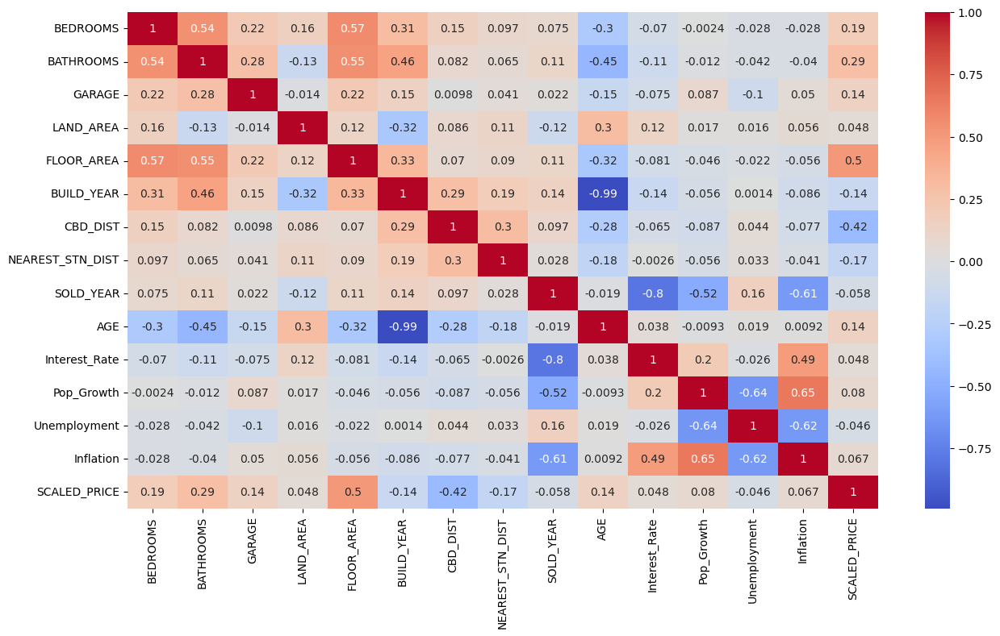

In [134]:

corr_matrix = df.corr()
plt.figure(figsize=(15,8))
sns.heatmap(corr_matrix, cmap="coolwarm", annot = True)
plt.show()


# 4) Prediction model

## 4.1) Split train test

In [135]:
#without economic index
x = encoded_df.drop(columns = ['SCALED_PRICE','SOLD_YEAR', 'BUILD_YEAR', 'SUBURB', 'Inflation', 'Interest_Rate', 'Pop_Growth', 'Unemployment'])

#with economic index
# x = encoded_df.drop(columns = ['SCALED_PRICE','SOLD_YEAR', 'BUILD_YEAR', 'SUBURB', 'Inflation'])
y = encoded_df[['SCALED_PRICE']]
x_train, x_test, y_train, y_test = train_test_split(x ,y ,test_size = 0.2, random_state = 1)

## 4.2) Normalization

In [136]:
scaler = StandardScaler()
x_train_norm = scaler.fit_transform(x_train)
x_test_norm = scaler.transform(x_test)

## 4.3) Build model

### 4.3.1) Neural Networks

Epoch 1/36
458/458 [==============================] - 1s 867us/step - loss: 5612.3271 - val_loss: 5439.1655
Epoch 2/36
458/458 [==============================] - 0s 720us/step - loss: 5053.1260 - val_loss: 4626.9824
Epoch 3/36
458/458 [==============================] - 0s 718us/step - loss: 3915.5850 - val_loss: 3167.5759
Epoch 4/36
458/458 [==============================] - 0s 720us/step - loss: 2538.2139 - val_loss: 2074.2507
Epoch 5/36
458/458 [==============================] - 0s 740us/step - loss: 1750.8462 - val_loss: 1498.2061
Epoch 6/36
458/458 [==============================] - 0s 731us/step - loss: 1302.3512 - val_loss: 1179.4442
Epoch 7/36
458/458 [==============================] - 0s 742us/step - loss: 1059.9010 - val_loss: 1014.2874
Epoch 8/36
458/458 [==============================] - 0s 731us/step - loss: 926.1172 - val_loss: 914.9005
Epoch 9/36
458/458 [==============================] - 0s 747us/step - loss: 842.8591 - val_loss: 849.3475
Epoch 10/36
458/458 [===========

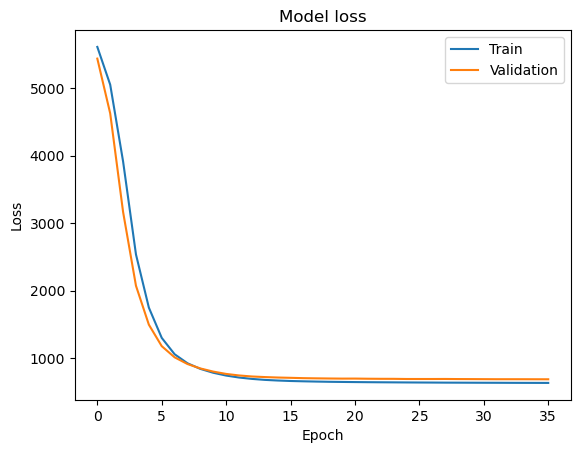

In [137]:
tf.random.set_seed(30)  # applied to achieve consistent results
nn_model = Sequential(
        [
            Dense(16, activation = 'relu'),
            Dense(1, activation = 'relu')
        ]
    )
nn_model.compile(
    loss=tf.keras.losses.Huber(delta=10.0),
    optimizer='adam',
    )
history = nn_model.fit(
            x_train_norm, y_train,
            epochs=36,
            validation_split=0.2
        )

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()


### 4.3.2) XGBoost

In [138]:
import xgboost as xgb

xgb_model = xgb.XGBRegressor(objective="reg:squarederror", random_state=42, max_depth= 5, n_estimators = 300)
xgb_model.fit(x_train_norm, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=300, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

### 4.3.3) Random Forest

In [139]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor()

rf_model.fit(x_train_norm, np.ravel(y_train))


RandomForestRegressor()

# 5) Model evaluation

In [140]:
def evaluate_result(model, y_test):
    
    y_predicted = model.predict(x_test_norm)
    print('\t \t Model Report')
    print('MAE: ',mean_absolute_error(y_test,y_predicted))
    print('MSE: ',mean_squared_error(y_test,y_predicted))
    print('RMSE: ',np.sqrt(mean_squared_error(y_test,y_predicted)))
    print('Variance Regression Score: ',explained_variance_score(y_test,y_predicted))

    #plot only
    plt.scatter(y_test, y_predicted)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.show()

    # sns.kdeplot(data=y_merge, palette=['orange', 'blue'], log_scale = False)
    
    y_predicted = pd.DataFrame(y_predicted, columns = ['y_predicted'])
    y_test = y_test.reset_index()
    y_test.drop(['index'],axis=1)

    y_merge = y_predicted
    y_merge['y_real'] = y_test['SCALED_PRICE']
    sns.kdeplot(data=y_merge, palette=['orange', 'blue']) 

We will test the model with the ```x_test_norm``` dataset

## 5.1) Neural Network

143/143 [==============================] - 0s 458us/step
	 	 Model Report
MAE:  71.22563548740074
MSE:  10732.601066247535
RMSE:  103.59826767976159
Variance Regression Score:  0.7882492152845142


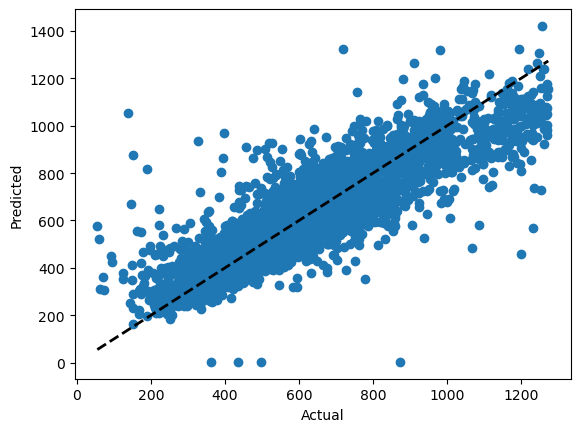

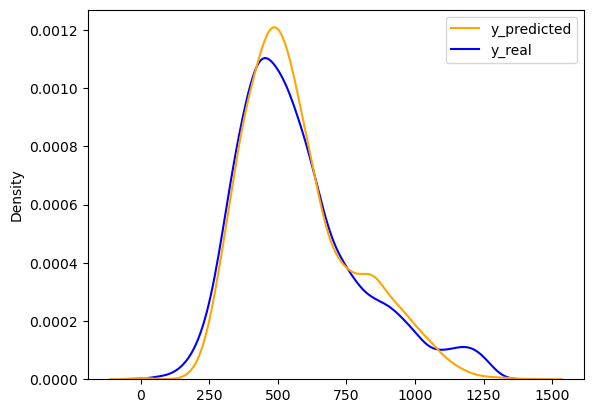

In [141]:
evaluate_result(nn_model, y_test)

## 5.2) XGBoost

	 	 Model Report
MAE:  67.79763653147413
MSE:  9671.28177778982
RMSE:  98.34267526252181
Variance Regression Score:  0.8092078118985655


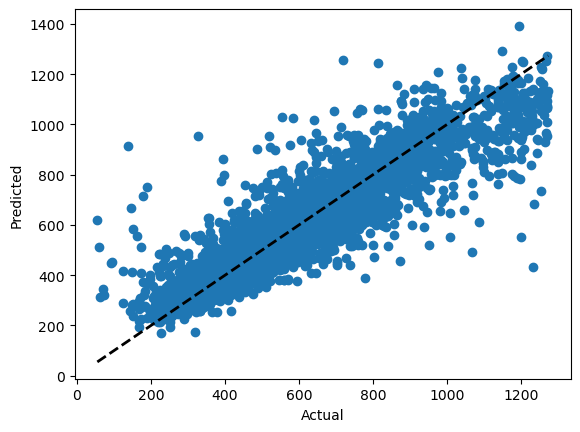

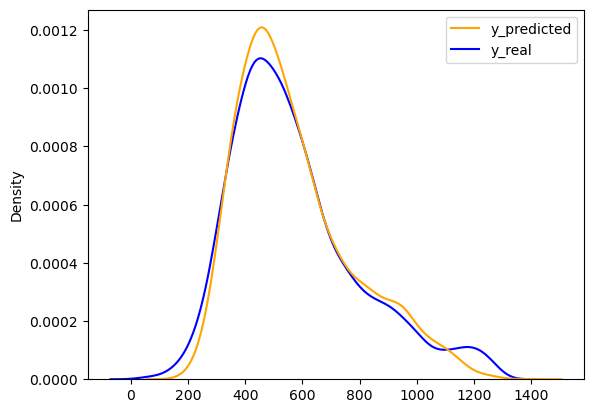

In [142]:
evaluate_result(xgb_model, y_test)

## 5.3) Random Forest

	 	 Model Report
MAE:  73.90437533193807
MSE:  11785.70418802527
RMSE:  108.5619831618107
Variance Regression Score:  0.7675360617599181


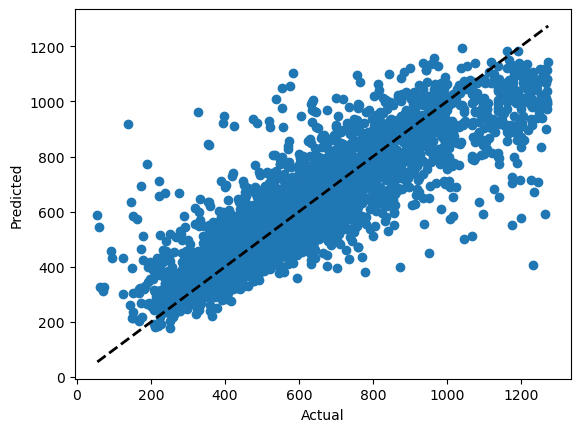

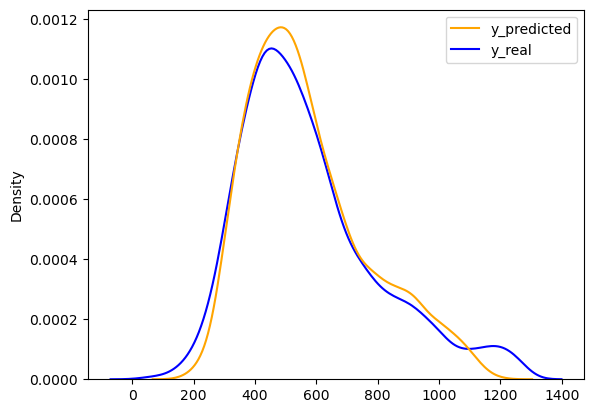

In [143]:
evaluate_result(rf_model, y_test)